In [2]:
from diffusers import StableDiffusionPipeline
from diffusers.schedulers import LMSDiscreteScheduler
from random import randrange
import torch
from diffusers import StableDiffusionPipeline
from diffusers.schedulers import (
    LMSDiscreteScheduler,
    DDPMScheduler,
    DPMSolverMultistepScheduler,
    PNDMScheduler,
)
import timm
import torchvision.transforms as transforms
from random import randrange
import requests
import torch.optim as optim
import numpy as np
from PIL import Image, ImageDraw
import numpy as np
import argparse
import os
import glob
from pathlib import Path

/home/jingyuan/anaconda3/envs/lwb/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# initialize stable diffusion pipeline
pipe = StableDiffusionPipeline.from_pretrained("../models/stable-diffusion-2-1")
pipe.to("cuda")
scheduler = LMSDiscreteScheduler.from_config(pipe.scheduler.config)
pipe.scheduler = scheduler
orig_embeddings = (
    pipe.text_encoder.text_model.embeddings.token_embedding.weight.clone().detach()
)
pipe.text_encoder.text_model.embeddings.token_embedding.weight.requires_grad_(False)

Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00,  9.73it/s]


Parameter containing:
tensor([[-0.0019, -0.0093,  0.0056,  ...,  0.0012, -0.0116,  0.0078],
        [ 0.0168,  0.0025, -0.0092,  ...,  0.0093, -0.0169,  0.0168],
        [-0.0087, -0.0275,  0.0082,  ..., -0.0155,  0.0097, -0.0119],
        ...,
        [-0.0038,  0.0344,  0.0041,  ...,  0.0066, -0.0116, -0.0079],
        [ 0.0004, -0.0038,  0.0039,  ..., -0.0008,  0.0012,  0.0006],
        [ 0.0034, -0.0028,  0.0003,  ..., -0.0032,  0.0009,  0.0016]],
       device='cuda:0')

## Load decomposition results

In [24]:
concept = "sadness"
folder = f"../sh/conceptor_results/{concept}"
# load coefficients  参数
alphas_dict = torch.load(f"{folder}/best_alphas.pt").detach_().requires_grad_(False)
# load vocabulary  词表
dictionary = torch.load(f"{folder}/dictionary.pt")

## Visualize top coefficients and top tokens

In [25]:
sorted_alphas, sorted_indices = torch.sort(alphas_dict, descending=True)
num_indices = 10
top_indices_orig_dict = [dictionary[i] for i in sorted_indices[:num_indices]]
print("top coefficients: ", sorted_alphas[:num_indices].cpu().numpy())
alpha_ids = [pipe.tokenizer.decode(idx) for idx in top_indices_orig_dict]
print("top tokens: ", alpha_ids)

top coefficients:  [0.2503212  0.22212808 0.22167929 0.22138071 0.2212732  0.21968782
 0.2118395  0.20666589 0.20431346 0.20323282]
top tokens:  ['dark', 'sleeper', 'crying', 'praying', 'weeping', 'pale', 'girl', 'alone', 'grief', 'angel']


In [12]:
num_tokens = 50
alphas = torch.zeros(orig_embeddings.shape[0]).cuda()
sorted_alphas, sorted_indices = torch.sort(alphas_dict.abs(), descending=True)
top_word_idx = [dictionary[i] for i in sorted_indices[:num_tokens]]
for i, index in enumerate(top_word_idx):
    alphas[index] = alphas_dict[sorted_indices[i]]

# add placeholder for w^*
placeholder_token = "<>"
pipe.tokenizer.add_tokens(placeholder_token)
placeholder_token_id = pipe.tokenizer.convert_tokens_to_ids(placeholder_token)
pipe.text_encoder.resize_token_embeddings(len(pipe.tokenizer))
token_embeds = (
    pipe.text_encoder.get_input_embeddings().weight.detach().requires_grad_(False)
)

# compute w^* and normalize its embedding
learned_embedding = torch.matmul(alphas, orig_embeddings).flatten()
norms = [i.norm().item() for i in orig_embeddings]
avg_norm = np.mean(norms)
learned_embedding /= learned_embedding.norm()
learned_embedding *= avg_norm

# add w^* to vocabulary
token_embeds[placeholder_token_id] = torch.nn.Parameter(learned_embedding)

In [8]:
import math


def get_image_grid(images) -> Image:
    num_images = len(images)
    cols = int(math.ceil(math.sqrt(num_images)))
    rows = int(math.ceil(num_images / cols))
    width, height = images[0].size
    grid_image = Image.new("RGB", (cols * width, rows * height))
    for i, img in enumerate(images):
        x = i % cols
        y = i // cols
        grid_image.paste(img, (x * width, y * height))
    return grid_image

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [01:31<00:00,  1.82s/it]


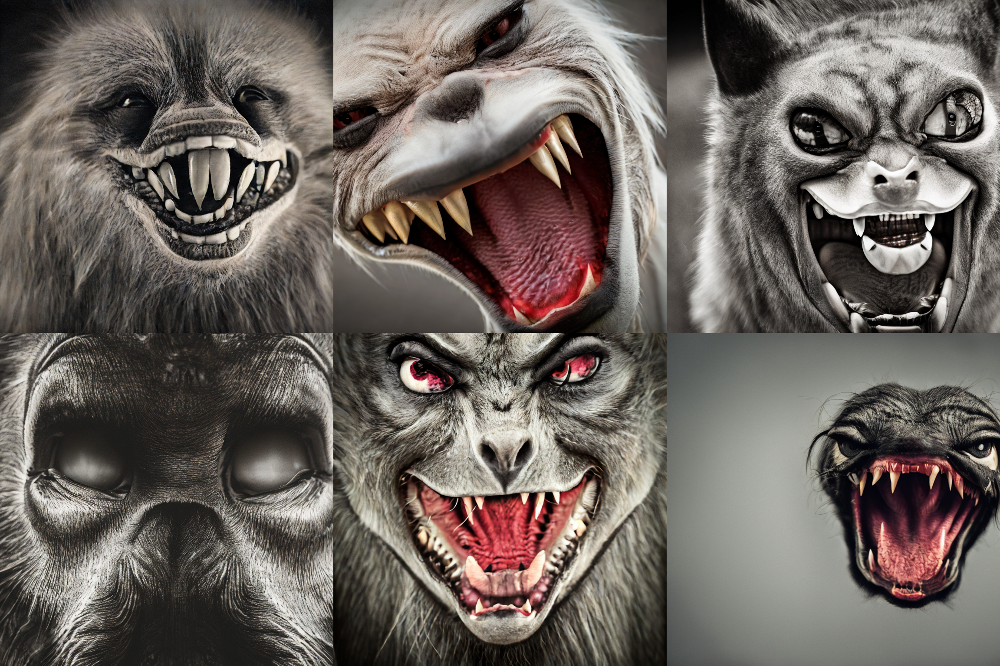

In [13]:
prompt = "a photo of a <>"

generator = torch.Generator("cuda").manual_seed(0)
image = pipe(
    prompt,
    guidance_scale=7.5,
    generator=generator,
    return_dict=False,
    num_images_per_prompt=6,
    num_inference_steps=50,
)
display(get_image_grid(image[0]))

100%|██████████| 50/50 [01:31<00:00,  1.83s/it]


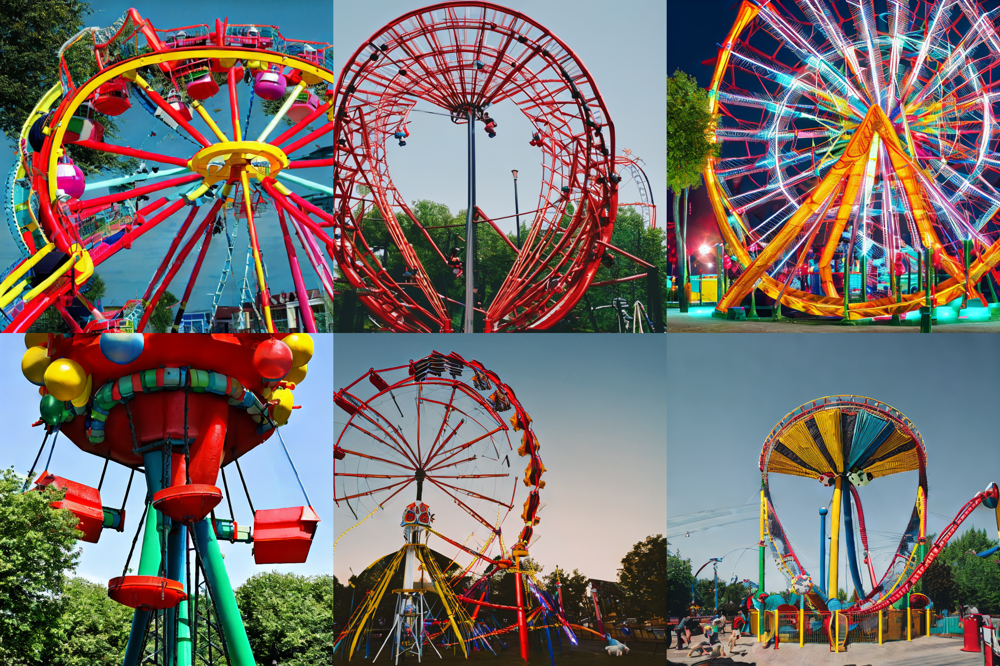

: 

In [14]:
prompt = "a photo of an amusement"
generator = torch.Generator("cuda").manual_seed(0)
image = pipe(
    prompt,
    guidance_scale=7.5,
    generator=generator,
    return_dict=False,
    num_images_per_prompt=6,
    num_inference_steps=50,
)
display(get_image_grid(image[0]))